<a href="https://colab.research.google.com/github/priyankakpal/Target-Analysis-Using-SQL-Tablue/blob/target-data/Cluster_BusniessCaseStudy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Define Problem Statement and perform Exploratory Data Analysis
1. Definition of problem (as per given problem statement with additional views)
2. Observations on shape of data, data types of all the attributes, conversion of categorical attributes to 'category' (If required) , missing value detection, statistical summary.
3. Univariate Analysis (distribution plots of all the continuous variable(s) barplots/countplots of all the categorical variables)
4. Bivariate Analysis (Relationships between important variables such as workday and count, season and count, weather and count.
5. Illustrate the insights based on EDA
1. Comments on range of attributes, outliers of various attributes
2. Comments on the distribution of the variables and relationship between them
3. Comments for each univariate and bivariate plots

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm

df = pd.read_csv('/content/scaler_clustering.csv')
df

,Unnamed: 0,company_hash,email_hash,orgyear,ctc,job_position,ctc_updated_year
0,0,atrgxnnt xzaxv,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,2016.0,1100000,Other,2020.0
1,1,qtrxvzwt xzegwgbb rxbxnta,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,2018.0,449999,FullStack Engineer,2019.0
2,2,ojzwnvwnxw vx,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,2015.0,2000000,Backend Engineer,2020.0
3,3,ngpgutaxv,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,2017.0,700000,Backend Engineer,2019.0
4,4,qxen sqghu,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,2017.0,1400000,FullStack Engineer,2019.0
...,...,...,...,...,...,...,...
205838,206918,vuurt xzw,70027b728c8ee901fe979533ed94ffda97be08fc23f33b...,2008.0,220000,NaN,2019.0
205839,206919,husqvawgb,7f7292ffad724ebbe9ca860f515245368d714c84705b42...,2017.0,500000,NaN,2020.0
205840,206920,vwwgrxnt,cb25cc7304e9a24facda7f5567c7922ffc48e3d5d6018c...,2021.0,700000,NaN,2021.0
205841,206921,zgn vuurxwvmrt,fb46a1a2752f5f652ce634f6178d0578ef6995ee59f6c8...,2019.0,5100000,NaN,2019.0


Definition of problem : We need to create the cluster on the basis of their job profile, company, and other features and find the best company and best position from scaler database

In [3]:
df.shape

(205843, 7)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205843 entries, 0 to 205842
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        205843 non-null  int64  
 1   company_hash      205799 non-null  object 
 2   email_hash        205843 non-null  object 
 3   orgyear           205757 non-null  float64
 4   ctc               205843 non-null  int64  
 5   job_position      153279 non-null  object 
 6   ctc_updated_year  205843 non-null  float64
dtypes: float64(2), int64(2), object(3)
memory usage: 11.0+ MB


In [5]:
df.describe()

,Unnamed: 0,orgyear,ctc,ctc_updated_year
count,205843.000000,205757.000000,2.058430e+05,205843.000000
mean,103273.941786,2014.882750,2.271685e+06,2019.628231
std,59741.306484,63.571115,1.180091e+07,1.325104
min,0.000000,0.000000,2.000000e+00,2015.000000
25%,51518.500000,2013.000000,5.300000e+05,2019.000000
50%,103151.000000,2016.000000,9.500000e+05,2020.000000
75%,154992.500000,2018.000000,1.700000e+06,2021.000000
max,206922.000000,20165.000000,1.000150e+09,2021.000000


In [6]:
unique_values = {}
for column in df.columns:
 unique_values[column] = df[column].unique()


for column, values in unique_values.items():
 print(f'Unique values in {column}: {values}')

Unique values in Unnamed: 0: [     0      1      2 ... 206920 206921 206922]
Unique values in company_hash: ['atrgxnnt xzaxv' 'qtrxvzwt xzegwgbb rxbxnta' 'ojzwnvwnxw vx' ...
 'ztdnowb xzwqtee' 'mrht onvnt axsxnvr' 'bvptbjnqxu td vbvkgz']
Unique values in email_hash: ['6de0a4417d18ab14334c3f43397fc13b30c35149d70c050c0618caea697c87af'
 'b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c100a9661a92bdcc0407b'
 '4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e90fd66c9df6b37b9059' ...
 'cb25cc7304e9a24facda7f5567c7922ffc48e3d5d6018c8852b58da2fde5e00c'
 'fb46a1a2752f5f652ce634f6178d0578ef6995ee59f6c819ec41f6af222a8699'
 '0bcfc1d05f2e8dc4147743a1313aa70a119b41b30d4a1f7e738a6a87d3712c31']
Unique values in orgyear: [2.0160e+03 2.0180e+03 2.0150e+03 2.0170e+03 2.0190e+03 2.0200e+03
 2.0120e+03 2.0130e+03 2.0030e+03 2.0060e+03 2.0140e+03 2.0110e+03
 2.0210e+03 2.0080e+03 2.0040e+03 2.0220e+03 2.0090e+03 2.0050e+03
 2.0100e+03 2.0070e+03 2.0000e+03 2.0020e+03 2.0230e+03 2.0010e+03
 1.9810e+03 2.0310e+03    

In [7]:
for column, values in unique_values.items():
 print(f'Count of non zero values in {column}: {np.count_nonzero(values)}')

Count of non zero values in Unnamed: 0: 205842
Count of non zero values in company_hash: 37300
Count of non zero values in email_hash: 153443
Count of non zero values in orgyear: 77
Count of non zero values in ctc: 3360
Count of non zero values in job_position: 1017
Count of non zero values in ctc_updated_year: 7


In [8]:
df.ctc_updated_year.value_counts()

,count
ctc_updated_year,
2019.0,68688
2021.0,64976
2020.0,49444
2017.0,7561
2018.0,6746
2016.0,5501
2015.0,2927


In [9]:
df.ctc_updated_year = df.ctc_updated_year.astype('int')

In [10]:
df.ctc_updated_year.dtype

dtype('int64')

In [11]:
df.ctc_updated_year.value_counts()

,count
ctc_updated_year,
2019,68688
2021,64976
2020,49444
2017,7561
2018,6746
2016,5501
2015,2927


In [12]:
np.count_nonzero(df['ctc_updated_year'])

205843

In [13]:
df.orgyear.isnull().sum()

86

In [14]:
df.company_hash.isnull().sum()

44

In [15]:
df.job_position.isnull().sum()

52564

Data Pre-processing:
1. Mean/ KNN Imputation
2. Regex for cleaning company names
3. Standardization & Encoding


In [16]:
df.company_hash.value_counts()

,count
company_hash,
nvnv wgzohrnvzwj otqcxwto,8337
xzegojo,5381
vbvkgz,3481
zgn vuurxwvmrt vwwghzn,3411
wgszxkvzn,3240
...,...
onvqmhwpo,1
bvsxw ogenfvqt uqxcvnt rxbxnta,1
agsbv ojontbo,1


Doing the CCA(Complete case analysis):

In [17]:
(df.orgyear.isnull().sum()/df.orgyear.count())*100

0.04179687689847733

In [18]:
df.orgyear.value_counts()

,count
orgyear,
2018.0,25256
2019.0,23427
2017.0,23239
2016.0,23043
2015.0,20610
...,...
2107.0,1
1972.0,1
2101.0,1


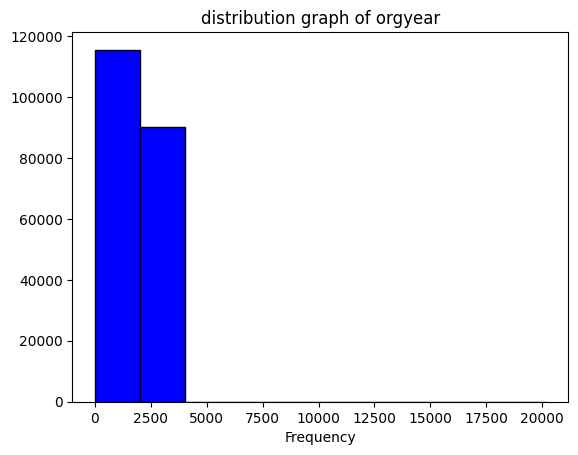

In [19]:
plt.hist(df['orgyear'],color='blue', edgecolor='black')
plt.title('distribution graph of orgyear')
plt.xlabel('Value')
plt.xlabel('Frequency')
plt.show()

In [20]:
skew_value = df['orgyear'].skew()
skew_value

219.88234285596823

The orgyear data is not normal distribuated it is skewed so we will you median data and one more reason is there missing data are less then 5% of total data so, we can use the median imputation technique to fill the numeric data

In [21]:
before_imputating_data = df['orgyear'].var()
before_imputating_data

4041.286710203918

In [22]:
df['orgyear_imputation'] = df['orgyear'].apply(lambda x: df['orgyear'].median() if pd.isnull(x) else x)

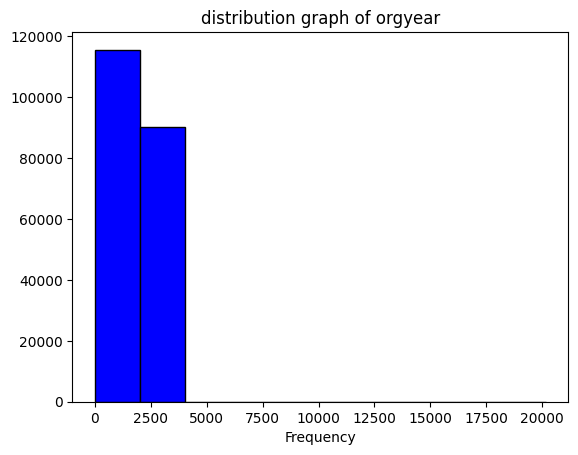

In [23]:
plt.hist(df['orgyear_imputation'],color='blue', edgecolor='black')
plt.title('distribution graph of orgyear')
plt.xlabel('Value')
plt.xlabel('Frequency')
plt.show()

In [24]:
After_imputating_data = df['orgyear_imputation'].var()
After_imputating_data

4039.598797374443

If you see the before and after imputation values it is almost similar and data are still right skewed ... it conclude that data imputation are correct

In [25]:
df.shape

(205843, 8)

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205843 entries, 0 to 205842
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Unnamed: 0          205843 non-null  int64  
 1   company_hash        205799 non-null  object 
 2   email_hash          205843 non-null  object 
 3   orgyear             205757 non-null  float64
 4   ctc                 205843 non-null  int64  
 5   job_position        153279 non-null  object 
 6   ctc_updated_year    205843 non-null  int64  
 7   orgyear_imputation  205843 non-null  float64
dtypes: float64(2), int64(3), object(3)
memory usage: 12.6+ MB


In [27]:
df.orgyear_imputation = df.orgyear_imputation.astype('int')

In [28]:
df.orgyear_imputation.dtype

dtype('int64')

Categorial data imputation :

In [29]:
df['job_position'].value_counts(normalize=True)*100

,proportion
job_position,
Backend Engineer,28.414851
FullStack Engineer,16.125497
Other,11.789612
Frontend Engineer,6.796104
Engineering Leadership,4.482023
...,...
PhD. Student,0.000652
Front-End Developer,0.000652
ayS,0.000652


In [30]:
df['job_position'].isnull().sum()

52564

In [31]:
(df['job_position'].isnull().sum()/df['job_position'].count())*100

34.29302122273762

In [32]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder

# Step 1: One-Hot Encode the nominal data
encoder = OneHotEncoder(sparse_output=False)
onehot_encoded = encoder.fit_transform(df[['job_position']])

# Create a DataFrame for the one-hot encoded data
onehot_encoded_df = pd.DataFrame(onehot_encoded, columns=encoder.get_feature_names_out(['job_position']))


# Step 2: Apply KNNImputer to the one-hot encoded data
imputer = KNNImputer(n_neighbors=2)
imputed_data = imputer.fit_transform(onehot_encoded_df)

# Convert the imputed data back into a DataFrame
imputed_df = pd.DataFrame(imputed_data, columns=onehot_encoded_df.columns)

# Step 3: Decode one-hot encoded data back to original categories
# Find the column with the maximum value (1.0) to get back the category
imputed_categories = encoder.inverse_transform(imputed_df)

# Add the imputed categories back to the original DataFrame
#df['job_position'] = imputed_categories

# Print the result
print(imputed_categories)

[['Other']
 ['FullStack Engineer']
 ['Backend Engineer']
 ...
 [nan]
 [nan]
 [nan]]


Data missing is more than the 5% of total data then we are using missing category imputation

In [33]:
df['job_position_imputation'] = df['job_position'].apply(lambda x: 'Missing Value' if pd.isnull(x) else x)

In [34]:
df['job_position_imputation'].value_counts()

,count
job_position_imputation,
Missing Value,52564
Backend Engineer,43554
FullStack Engineer,24717
Other,18071
Frontend Engineer,10417
...,...
Compliance auditor,1
91,1
Senior Software Development Engineer (Backend),1


In [35]:
(df.company_hash.isnull().sum()/df.company_hash.count())*100

0.021380084451333582

Categorial data having less than 5% missing data then we can you the most frequent value imputation technique

In [36]:
df['company_hash_imputation'] = df['company_hash'].apply(lambda x: df['company_hash'].mode() if pd.isnull(x) else x)

In [37]:
df.company_hash_imputation.isnull().sum()

0

In [38]:
import re

df.company_hash_imputation

,company_hash_imputation
0,atrgxnnt xzaxv
1,qtrxvzwt xzegwgbb rxbxnta
2,ojzwnvwnxw vx
3,ngpgutaxv
4,qxen sqghu
...,...
205838,vuurt xzw
205839,husqvawgb
205840,vwwgrxnt
205841,zgn vuurxwvmrt


In [39]:
df['company_hash_imputation'] = df['company_hash_imputation'].apply(lambda x: re.sub('[^A-Za-z0-9 ]+', '', str(x)))

In [40]:
df['company_hash_imputation']

,company_hash_imputation
0,atrgxnnt xzaxv
1,qtrxvzwt xzegwgbb rxbxnta
2,ojzwnvwnxw vx
3,ngpgutaxv
4,qxen sqghu
...,...
205838,vuurt xzw
205839,husqvawgb
205840,vwwgrxnt
205841,zgn vuurxwvmrt


In [41]:
new_df = df

In [42]:
df.columns

Index(['Unnamed: 0', 'company_hash', 'email_hash', 'orgyear', 'ctc',
       'job_position', 'ctc_updated_year', 'orgyear_imputation',
       'job_position_imputation', 'company_hash_imputation'],
      dtype='object')

In [43]:
new_df.drop(columns=['orgyear','job_position','company_hash'], inplace=True)

In [44]:
new_df

,Unnamed: 0,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation
0,0,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,1100000,2020,2016,Other,atrgxnnt xzaxv
1,1,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,449999,2019,2018,FullStack Engineer,qtrxvzwt xzegwgbb rxbxnta
2,2,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,2000000,2020,2015,Backend Engineer,ojzwnvwnxw vx
3,3,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,700000,2019,2017,Backend Engineer,ngpgutaxv
4,4,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,1400000,2019,2017,FullStack Engineer,qxen sqghu
...,...,...,...,...,...,...,...
205838,206918,70027b728c8ee901fe979533ed94ffda97be08fc23f33b...,220000,2019,2008,Missing Value,vuurt xzw
205839,206919,7f7292ffad724ebbe9ca860f515245368d714c84705b42...,500000,2020,2017,Missing Value,husqvawgb
205840,206920,cb25cc7304e9a24facda7f5567c7922ffc48e3d5d6018c...,700000,2021,2021,Missing Value,vwwgrxnt
205841,206921,fb46a1a2752f5f652ce634f6178d0578ef6995ee59f6c8...,5100000,2019,2019,Missing Value,zgn vuurxwvmrt


In [45]:
new_df = new_df.drop_duplicates()

In [46]:
new_df.shape # there is no duplicate value in dataframe

(205843, 7)

In [47]:
df.email_hash.value_counts()

,count
email_hash,
bbace3cc586400bbc65765bc6a16b77d8913836cfc98b77c05488f02f5714a4b,10
6842660273f70e9aa239026ba33bfe82275d6ab0d20124021b952b5bc3d07e6c,9
298528ce3160cc761e4dc37a07337ee2e0589df251d73645aae209b010210eee,9
3e5e49daa5527a6d5a33599b238bf9bf31e85b9efa9a94f1c88c5e15a6f31378,9
b4d5afa09bec8689017d8b29701b80d664ca37b83cb883376b2e95191320da66,8
...,...
bb2fe5e655ada7f7b7ac4a614db0b9c560e796bdfcaa4e5367e69eedfea93876,1
d6cdef97e759dbf1b7522babccbbbd5f164a75d1b4139e02c945958720f1ed79,1
700d1190c17aaa3f2dd9070e47a4c042ecd9205333545dbfaee0f85644d00306,1


In [48]:
new_df['Year_of_experience'] = pd.Timestamp.now().year - new_df['orgyear_imputation']

In [49]:
new_df['Year_of_experience'].value_counts()

,count
Year_of_experience,
6,25256
5,23427
7,23239
8,23129
9,20610
...,...
-83,1
52,1
-77,1


In [50]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205843 entries, 0 to 205842
Data columns (total 8 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   Unnamed: 0               205843 non-null  int64 
 1   email_hash               205843 non-null  object
 2   ctc                      205843 non-null  int64 
 3   ctc_updated_year         205843 non-null  int64 
 4   orgyear_imputation       205843 non-null  int64 
 5   job_position_imputation  205843 non-null  object
 6   company_hash_imputation  205843 non-null  object
 7   Year_of_experience       205843 non-null  int64 
dtypes: int64(5), object(3)
memory usage: 12.6+ MB


In [51]:
new_df.describe()

,Unnamed: 0,ctc,ctc_updated_year,orgyear_imputation,Year_of_experience
count,205843.000000,2.058430e+05,205843.000000,205843.000000,205843.000000
mean,103273.941786,2.271685e+06,2019.628231,2014.883217,9.116783
std,59741.306484,1.180091e+07,1.325104,63.557838,63.557838
min,0.000000,2.000000e+00,2015.000000,0.000000,-18141.000000
25%,51518.500000,5.300000e+05,2019.000000,2013.000000,6.000000
50%,103151.000000,9.500000e+05,2020.000000,2016.000000,8.000000
75%,154992.500000,1.700000e+06,2021.000000,2018.000000,11.000000
max,206922.000000,1.000150e+09,2021.000000,20165.000000,2024.000000


In [52]:
new_df[new_df.orgyear_imputation<4]

,Unnamed: 0,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience
13424,13433,854ff163ded87211b944dfcaebdcf9e8efa45defc9582f...,700000,2021,0,Missing Value,9xntwyzgrgsj,2024
30335,30366,d767ad3012a86dab37a38a106f65d00b85189fe49a3f0f...,220000,2020,0,Missing Value,avqn xzzgcvnxgz,2024
32086,32118,ae1b500192dcd0b6c2d5c69b51f6caf19c630640c0aeb1...,600000,2021,0,Missing Value,lxg,2024
33117,33157,8ef16126bd9a4691801d2830156dc5528142a45d314593...,1200000,2021,0,Missing Value,mvzp ge vbtqxwv,2024
40553,40601,a0f794db04d5c13cae6f07c6ce9aee8ff731176cc4d4a1...,600000,2021,0,Missing Value,mqvpto xzaxv rna,2024
56770,56842,536e217527d1101538c70b7001d7e28344dba87cd8e246...,400000,2021,0,Missing Value,vngo ojzntr,2024
62717,62801,a1da4f131e2efea24f6d64c66519724aa5c8c5c11a23d9...,1850000,2019,0,FullStack Engineer,wyvqstugxzn,2024
63629,63713,5bbebf13d3b3edc497bc5e24d1ab540b66b3d9328d4948...,700000,2019,0,FullStack Engineer,bxznb xzw,2024
66344,66436,583d48749d8f694951a25ceebe4c0cdebc814a5b6def5b...,1800000,2019,3,Product Designer,fxkzx ogenfvqt uqxcvnt rxbxnta,2021
74313,74419,b9fac647e08fe47c6d112466c338e847e82e8f24e16236...,1000000,2021,0,Missing Value,ovbohzs trtwnqgzxwo,2024


Employee start date are incorrect in 28 records

In [53]:
new_df[new_df.orgyear_imputation<4]['orgyear_imputation'].count()

28

In [54]:
new_df[new_df.orgyear_imputation<4][['ctc','job_position_imputation']].value_counts(normalize=True)*100

,,proportion
ctc,job_position_imputation,
600000,Missing Value,7.142857
700000,Missing Value,7.142857
220000,Missing Value,3.571429
1580000,Engineering Leadership,3.571429
2950000,Engineering Leadership,3.571429
2900000,Data Scientist,3.571429
2500000,Missing Value,3.571429
1950000,Devops Engineer,3.571429
1939999,Backend Engineer,3.571429


In [55]:
new_df[new_df.orgyear_imputation<4]['job_position_imputation'].value_counts(normalize=True)*100

,proportion
job_position_imputation,
Missing Value,46.428571
Backend Engineer,10.714286
FullStack Engineer,7.142857
Engineering Leadership,7.142857
Frontend Engineer,7.142857
Devops Engineer,7.142857
Product Designer,3.571429
QA Engineer,3.571429
iOS Engineer,3.571429


In [56]:
new_df[new_df.orgyear_imputation<4]['ctc_updated_year'].value_counts(normalize=True)*100

,proportion
ctc_updated_year,
2019,57.142857
2021,28.571429
2020,14.285714


In [57]:
new_df[new_df.orgyear_imputation<4]['ctc'].value_counts(normalize=True)*100

,proportion
ctc,
700000,10.714286
1850000,7.142857
1600000,7.142857
600000,7.142857
1200000,3.571429
690000,3.571429
800000,3.571429
1939999,3.571429
2500000,3.571429


In [58]:
new_df[((new_df.orgyear_imputation<4) & (new_df.job_position_imputation=='Missing Value'))]['job_position_imputation'].count()

13

In [59]:
new_df[new_df.job_position_imputation=='Missing Value']['job_position_imputation'].count()

52564

employee start date which is less than 4 and having missing value job position there are 0.025 % of total missing value job position from database

In [60]:
(new_df[((new_df.orgyear_imputation<4) & (new_df.job_position_imputation=='Missing Value'))]['job_position_imputation'].count()/new_df[new_df.job_position_imputation=='Missing Value']['job_position_imputation'].count())*100

0.024731755574157216

In [61]:
new_df['Unnamed: 0'].count()

205843

In [62]:
new_df[new_df['Unnamed: 0'] != new_df.index]

,Unnamed: 0,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience
4569,4570,18193da94d05411768868ec59f62a1e89d29ca109f5f8d...,1900000,2021,2010,FullStack Engineer,vuntvz,14
4570,4571,1a3339d87bfbb56323ee73838e284974a63c03ee5c887b...,1350000,2021,2018,SDET,trtpnqgmxn tm,6
4571,4572,d1933be144f30c2b8a653d68b06ec60aadd9aab0dd53f3...,1100000,2021,2012,Missing Value,oxszxej xzzgcvnxgz rvmo,12
4572,4573,bf86fc610bff54dd33008d4307fc6023f043c3776cc950...,450000,2021,2020,Missing Value,vbagwo,4
4573,4574,6f26f6b63dca5871689ab9aac08f8e4c3c631c45e173e9...,350000,2021,2019,Devops Engineer,bxzanqtt,5
...,...,...,...,...,...,...,...,...
205838,206918,70027b728c8ee901fe979533ed94ffda97be08fc23f33b...,220000,2019,2008,Missing Value,vuurt xzw,16
205839,206919,7f7292ffad724ebbe9ca860f515245368d714c84705b42...,500000,2020,2017,Missing Value,husqvawgb,7
205840,206920,cb25cc7304e9a24facda7f5567c7922ffc48e3d5d6018c...,700000,2021,2021,Missing Value,vwwgrxnt,3
205841,206921,fb46a1a2752f5f652ce634f6178d0578ef6995ee59f6c8...,5100000,2019,2019,Missing Value,zgn vuurxwvmrt,5


In [63]:
new_df[new_df['Unnamed: 0']>4565]

,Unnamed: 0,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience
4566,4566,42a998579f8c727a1ff95f3b398929efee0fe3517aa3da...,400000,2021,2019,Missing Value,fxuqg rxbxnta,5
4567,4567,4dfc9c86ded024ccf021ec1951a07b8d2632674499c32f...,1500000,2021,2010,Backend Engineer,nwo xgz,14
4568,4568,2b212fcc84c3518424363d958dd57a3007e71b272a5b4b...,1000000,2021,2011,Missing Value,cvrhtrvmo,13
4569,4570,18193da94d05411768868ec59f62a1e89d29ca109f5f8d...,1900000,2021,2010,FullStack Engineer,vuntvz,14
4570,4571,1a3339d87bfbb56323ee73838e284974a63c03ee5c887b...,1350000,2021,2018,SDET,trtpnqgmxn tm,6
...,...,...,...,...,...,...,...,...
205838,206918,70027b728c8ee901fe979533ed94ffda97be08fc23f33b...,220000,2019,2008,Missing Value,vuurt xzw,16
205839,206919,7f7292ffad724ebbe9ca860f515245368d714c84705b42...,500000,2020,2017,Missing Value,husqvawgb,7
205840,206920,cb25cc7304e9a24facda7f5567c7922ffc48e3d5d6018c...,700000,2021,2021,Missing Value,vwwgrxnt,3
205841,206921,fb46a1a2752f5f652ce634f6178d0578ef6995ee59f6c8...,5100000,2019,2019,Missing Value,zgn vuurxwvmrt,5


Unname: 0 column sequence not proper and it is index column and we get default index column from dataframe so, we just drop the column

In [64]:
new_df = new_df.drop(columns='Unnamed: 0', inplace=False)

In [65]:
new_df

,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience
0,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,1100000,2020,2016,Other,atrgxnnt xzaxv,8
1,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,449999,2019,2018,FullStack Engineer,qtrxvzwt xzegwgbb rxbxnta,6
2,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,2000000,2020,2015,Backend Engineer,ojzwnvwnxw vx,9
3,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,700000,2019,2017,Backend Engineer,ngpgutaxv,7
4,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,1400000,2019,2017,FullStack Engineer,qxen sqghu,7
...,...,...,...,...,...,...,...
205838,70027b728c8ee901fe979533ed94ffda97be08fc23f33b...,220000,2019,2008,Missing Value,vuurt xzw,16
205839,7f7292ffad724ebbe9ca860f515245368d714c84705b42...,500000,2020,2017,Missing Value,husqvawgb,7
205840,cb25cc7304e9a24facda7f5567c7922ffc48e3d5d6018c...,700000,2021,2021,Missing Value,vwwgrxnt,3
205841,fb46a1a2752f5f652ce634f6178d0578ef6995ee59f6c8...,5100000,2019,2019,Missing Value,zgn vuurxwvmrt,5


In [66]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205843 entries, 0 to 205842
Data columns (total 7 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   email_hash               205843 non-null  object
 1   ctc                      205843 non-null  int64 
 2   ctc_updated_year         205843 non-null  int64 
 3   orgyear_imputation       205843 non-null  int64 
 4   job_position_imputation  205843 non-null  object
 5   company_hash_imputation  205843 non-null  object
 6   Year_of_experience       205843 non-null  int64 
dtypes: int64(4), object(3)
memory usage: 11.0+ MB


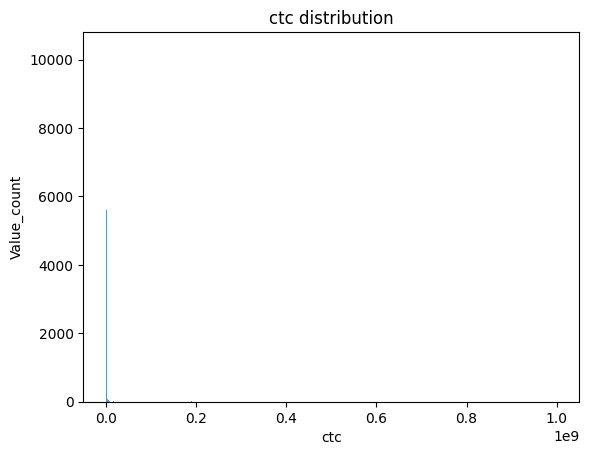

In [67]:
sns.histplot(new_df['ctc'])
plt.xlabel('ctc')
plt.ylabel('Value_count')
plt.title('ctc distribution')

plt.show()

In [68]:
new_df['ctc'].value_counts()

,count
ctc,
600000,7832
400000,7598
1000000,7581
500000,7242
800000,6752
...,...
1916000,1
5340000,1
2305000,1


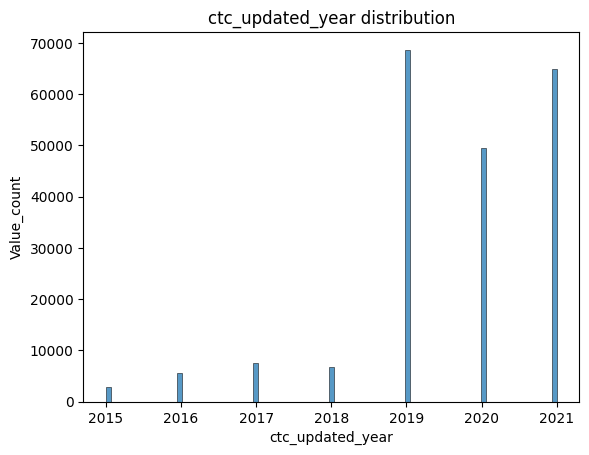

In [69]:
sns.histplot(new_df['ctc_updated_year'])
plt.xlabel('ctc_updated_year')
plt.ylabel('Value_count')
plt.title('ctc_updated_year distribution')

plt.show()

More number of employee having backend engineer and fullstack engineer in scaler and most larger count goes to missing position

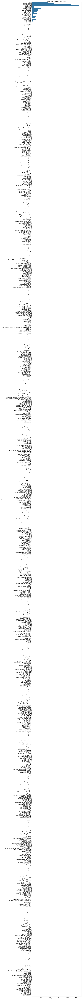

In [70]:
plt.figure(figsize=(10, 200))

sns.countplot(new_df['job_position_imputation'])
plt.xlabel('job_position_imputation')
plt.ylabel('Value_count')
plt.title('job_position_imputation distribution')

plt.show()

<Axes: xlabel='ctc', ylabel='Year_of_experience'>

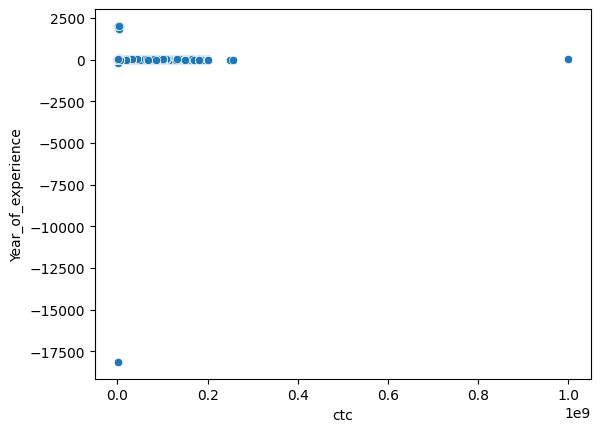

In [71]:
sns.scatterplot(x=new_df['ctc'], y=new_df['Year_of_experience'], data=new_df)

<Axes: xlabel='ctc_updated_year', ylabel='ctc'>

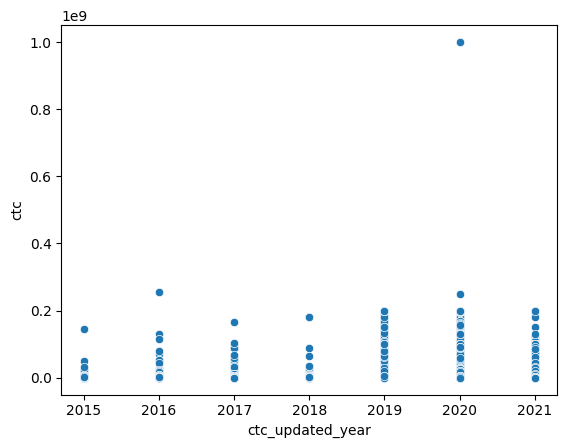

In [72]:
sns.scatterplot(y=new_df['ctc'], x=new_df['ctc_updated_year'], data=new_df)

<Axes: xlabel='ctc', ylabel='job_position_imputation'>

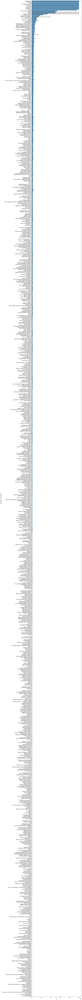

In [73]:
plt.figure(figsize=(10, 200))

mean_counts = new_df.groupby('job_position_imputation')['ctc'].mean().sort_values(ascending=False).index

sns.barplot(x=new_df['ctc'], y=new_df['job_position_imputation'], data=new_df, order=mean_counts)

In [74]:
new_df.groupby('job_position_imputation')['ctc'].mean().sort_values(ascending=False).index

Index(['Business Man', 'Jharkhand', 'Telar', 'Computer Scientist 2',
       '7033771951', 'Reseller', 'Data entry', 'Safety officer', 'Seleceman',
       'Driver',
       ...
       'iOS / Swift Developer', 'SDE, Lead', 'Software Engineering',
       'Junior consultant', 'Matlab programmer',
       'Some data entry operator like some copy's write.type and upload',
       'Any technical', 'Full-stack web developer', 'New graduate',
       'Technical consultant'],
      dtype='object', name='job_position_imputation', length=1017)

In [75]:
new_df[new_df['job_position_imputation']=='Jharkhand']

,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience
95468,c24db184651b61a9336f6f323f82ee9f793702b6ae249b...,100000000,2021,2021,Jharkhand,zgn vuurxwvmrt vwwghzn,3


In [76]:
new_df.groupby('job_position_imputation')['ctc'].mean().sort_values(ascending=False)

,ctc
job_position_imputation,
Business Man,100000000.0
Jharkhand,100000000.0
Telar,100000000.0
Computer Scientist 2,100000000.0
7033771951,100000000.0
...,...
Some data entry operator like some copy's write.type and upload,10000.0
Any technical,10000.0
Full-stack web developer,7500.0


<Axes: xlabel='count', ylabel='job_position_imputation'>

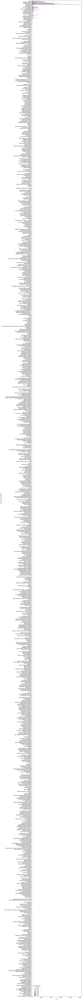

In [77]:
plt.figure(figsize=(10, 200))
sns.countplot(y=new_df['job_position_imputation'],hue=df['ctc_updated_year'],data=new_df)

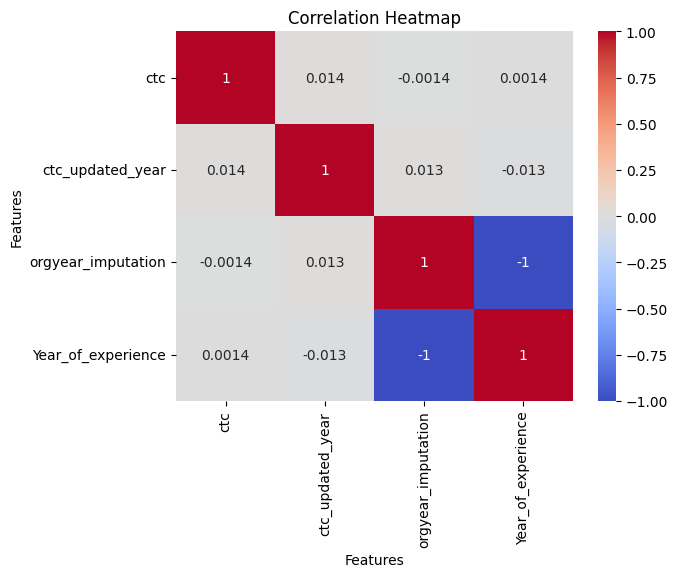

In [78]:
column_name = new_df.select_dtypes(include='int')

sns.heatmap(column_name.corr(), annot=True, cmap='coolwarm')
# Add labels and a title
plt.xlabel('Features')
plt.ylabel('Features')
plt.title('Correlation Heatmap')
# Show the plot
plt.show()

<Figure size 100x200 with 0 Axes>

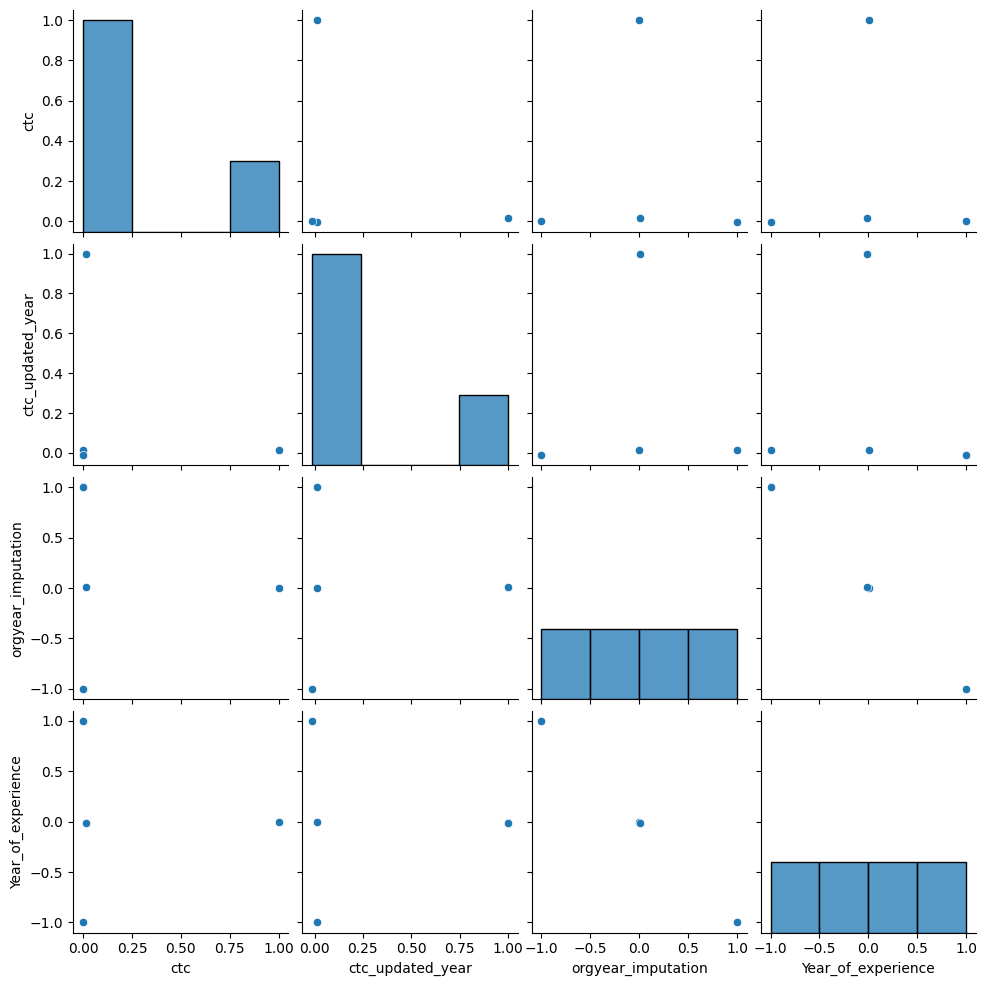

In [79]:
plt.figure(figsize=(1, 2))
sns.pairplot(column_name.corr())
# Show the plot
plt.show()

<Axes: ylabel='job_position_imputation'>

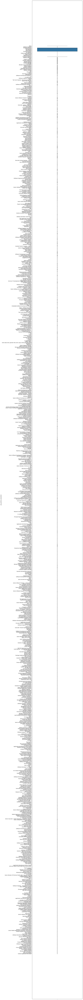

In [80]:
plt.figure(figsize=(10, 200))
sns.boxplot(new_df['job_position_imputation'])

<Axes: ylabel='ctc'>

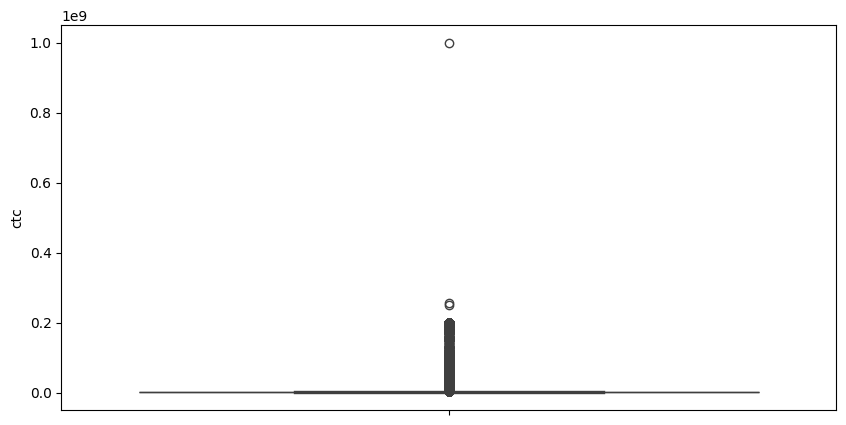

In [81]:
plt.figure(figsize=(10, 5))
sns.boxplot(new_df['ctc'])

<Axes: ylabel='ctc_updated_year'>

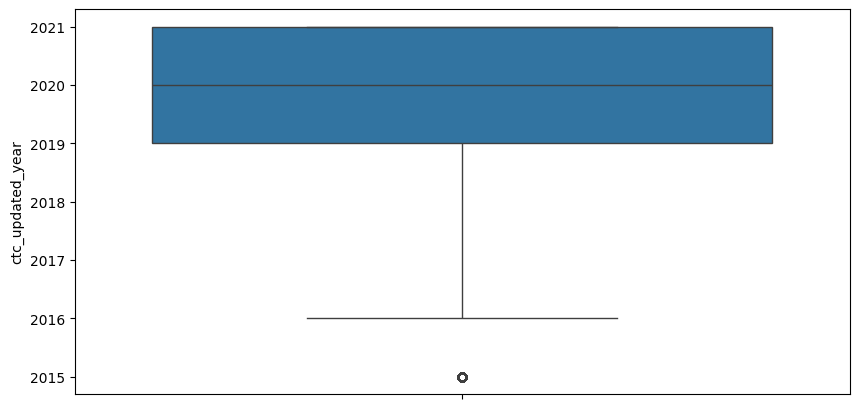

In [82]:
plt.figure(figsize=(10, 5))
sns.boxplot(new_df['ctc_updated_year'])

<Axes: ylabel='Year_of_experience'>

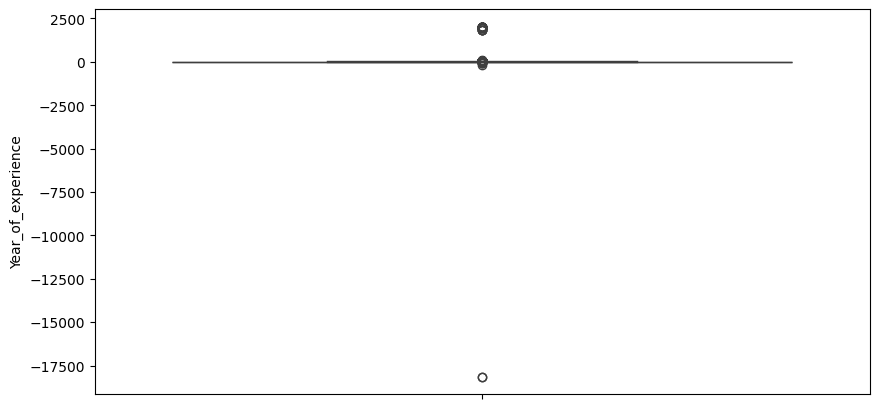

In [83]:
plt.figure(figsize=(10, 5))
sns.boxplot(new_df['Year_of_experience'])

<Axes: ylabel='orgyear_imputation'>

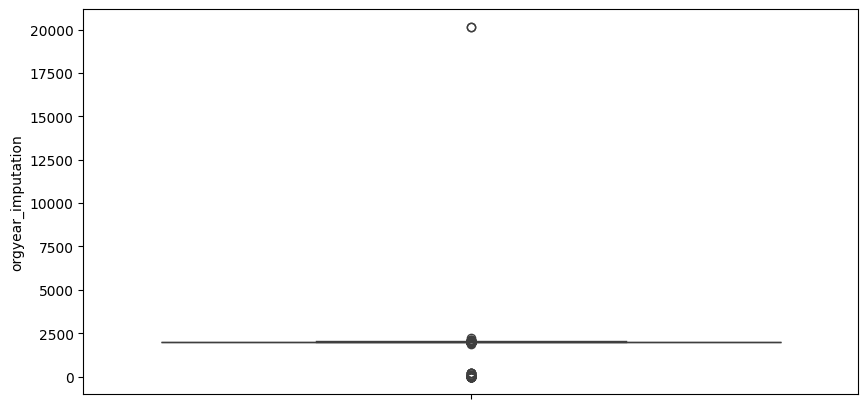

In [84]:
plt.figure(figsize=(10, 5))
sns.boxplot(new_df['orgyear_imputation'])

In [85]:
Q3=np.percentile(new_df['ctc'],75)
Q1=np.percentile(new_df['ctc'],25)
IQR=Q3-Q1
upp_whisk_ctc=Q3+(1.5*IQR)
low_whisk_ctc=max(Q1-(1.5*IQR),0)
print('Upper Whiskers=',upp_whisk_ctc)
print('Lower Whiskers=',low_whisk_ctc)

Upper Whiskers= 3455000.0
Lower Whiskers= 0


In [86]:
print('Outlier for upper whiskers')
new_df.loc[new_df['ctc']>upp_whisk_ctc]

Outlier for upper whiskers


,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience
25,d2668cb959e5657c3881413257b9850caa1359c7ce959a...,9500000,2019,2015,Backend Engineer,nxbto xzntqztn,9
38,69ef6838be8ee5b628375b4cc160ba54c1f7cab8c3b130...,11800000,2019,2006,QA Engineer,evzzxt bvt,18
93,2b0daf6243847309e75a47fb22e9e3dc3f79031edf464a...,5000000,2020,2021,Android Engineer,xb v onhatzn,3
106,996aef9bba62bd99d6cb8e8c112c0ec8096b203ae50b97...,200000000,2020,2017,Support Engineer,oxburjyq ogrhnxgzo rru,7
118,a37740bc0cedb23fd029276cbb7f4e821cca7df8dd0f70...,6300000,2019,2011,Backend Engineer,bgzgnjut,13
...,...,...,...,...,...,...,...
205808,6992f22d82e33d5e9c625dd2799b874868b6c8dc03fa16...,4200000,2019,2013,Missing Value,vbvkgz,11
205821,3def1401b5a8879eeb4a8465663a9c6c66702c85444d7e...,3500000,2016,2012,Missing Value,rxnyxhb ntwyzgrgsxto,12
205825,95023bca0172ad67bfc3453550c5cf056557bc2c8c7169...,4800000,2020,2016,Missing Value,vbvkgz,8
205833,f4415be48a1ef885e086dcd72181f667a289641e66f828...,3800000,2019,2014,Missing Value,vbvkgz,10


Manual Clustering:
1. Creating Designation Flag & Insights
2. Creating Class Flag & Insights
3. Creating Tier Flag & Insights

In [87]:
### Part 1: Group by Company, Job Position, and Years of Experience - CTC Summary

# Get the 5-point summary of CTC
summary = new_df.groupby(['company_hash_imputation', 'job_position_imputation', 'Year_of_experience'])['ctc'].agg(
    count='count',
    mean='mean',
    median='median',
    min='min',
    max='max',
    std='std'
).reset_index()

# Merge summary with original DataFrame
merged_df = pd.merge(new_df, summary, on=['company_hash_imputation', 'job_position_imputation', 'Year_of_experience'], how='left')

### Part 2: Create 'Designation' flag at Company, Job Position, and Experience level

def create_ctc_flag(row):
    if row['ctc'] <= row['mean']:
        return 1  # CTC is less than or equal to the department average
    elif row['ctc'] > row['mean'] and row['ctc'] <= row['mean'] * 1.1:
        return 2  # CTC is slightly greater (within 10% of the average)
    else:
        return 3  # CTC is significantly greater (more than 10% of the average)

# Apply the function to create Designation flag
merged_df['Designation'] = merged_df.apply(create_ctc_flag, axis=1)


### Part 3: Group by Company & Job Position - CTC Summary

# Get summary at the Company & Job Position level
summary_class = new_df.groupby(['company_hash_imputation', 'job_position_imputation'])['ctc'].agg(
    count='count',
    mean='mean',
    median='median',
    min='min',
    max='max',
    std='std'
).reset_index()

# Merge summary with the original DataFrame
merged_class_df = pd.merge(merged_df, summary_class, on=['company_hash_imputation', 'job_position_imputation'], how='left', suffixes=('', '_class'))

# Create Class flag
def create_class_flag(row):
    if row['ctc'] <= row['mean_class']:
        return 1  # CTC is less than or equal to the department average at Job Position level
    elif row['ctc'] > row['mean_class'] and row['ctc'] <= row['mean_class'] * 1.1:
        return 2  # CTC is slightly greater (within 10% of the average)
    else:
        return 3  # CTC is significantly greater (more than 10% of the average)

# Apply the function to create Class flag
merged_class_df['Class'] = merged_class_df.apply(create_class_flag, axis=1)


### Part 4: Group by Company level - CTC Summary

# Get summary at the Company level
summary_tier = new_df.groupby(['company_hash_imputation'])['ctc'].agg(
    count='count',
    mean='mean',
    median='median',
    min='min',
    max='max',
    std='std'
).reset_index()

# Merge summary with the original DataFrame
final_df = pd.merge(merged_class_df, summary_tier, on=['company_hash_imputation'], how='left', suffixes=('', '_tier'))

# Create Tier flag
def create_tier_flag(row):
    if row['ctc'] <= row['mean_tier']:
        return 1  # CTC is less than or equal to the average at Company level
    elif row['ctc'] > row['mean_tier'] and row['ctc'] <= row['mean_tier'] * 1.1:
        return 2  # CTC is slightly greater (within 10% of the average)
    else:
        return 3  # CTC is significantly greater (more than 10% of the average)

# Apply the function to create Tier flag
final_df['Tier'] = final_df.apply(create_tier_flag, axis=1)

In [88]:
final_df

,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience,count,mean,median,...,max_class,std_class,Class,count_tier,mean_tier,median_tier,min_tier,max_tier,std_tier,Tier
0,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,1100000,2020,2016,Other,atrgxnnt xzaxv,8,1,1.100000e+06,1100000.0,...,1100000,2.121320e+04,2,9,1.115667e+06,1070000.0,500000,1771000,4.581119e+05,1
1,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,449999,2019,2018,FullStack Engineer,qtrxvzwt xzegwgbb rxbxnta,6,7,7.742856e+05,750000.0,...,2000000,4.843895e+05,1,429,2.193027e+06,900000.0,10000,200000000,1.184184e+07,1
2,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,2000000,2020,2015,Backend Engineer,ojzwnvwnxw vx,9,1,2.000000e+06,2000000.0,...,2000000,NaN,1,1,2.000000e+06,2000000.0,2000000,2000000,NaN,1
3,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,700000,2019,2017,Backend Engineer,ngpgutaxv,7,7,1.158571e+06,1200000.0,...,3500000,6.772124e+05,1,70,1.713929e+06,1400000.0,200000,4700000,9.677693e+05,1
4,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,1400000,2019,2017,FullStack Engineer,qxen sqghu,7,1,1.400000e+06,1400000.0,...,1400000,4.801389e+05,3,6,9.400000e+05,850000.0,540000,1400000,3.898718e+05,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205838,70027b728c8ee901fe979533ed94ffda97be08fc23f33b...,220000,2019,2008,Missing Value,vuurt xzw,16,1,2.200000e+05,220000.0,...,3500000,1.281569e+06,1,17,1.681941e+06,2300000.0,60000,3500000,1.281569e+06,1
205839,7f7292ffad724ebbe9ca860f515245368d714c84705b42...,500000,2020,2017,Missing Value,husqvawgb,7,3,1.150000e+06,1450000.0,...,1500000,3.300369e+05,1,108,2.105185e+06,1200000.0,200000,74200000,7.058468e+06,1
205840,cb25cc7304e9a24facda7f5567c7922ffc48e3d5d6018c...,700000,2021,2021,Missing Value,vwwgrxnt,3,3,6.666667e+05,700000.0,...,4800000,8.326817e+05,1,169,1.404485e+06,1300000.0,200000,4800000,6.869181e+05,1
205841,fb46a1a2752f5f652ce634f6178d0578ef6995ee59f6c8...,5100000,2019,2019,Missing Value,zgn vuurxwvmrt,5,190,5.920732e+06,710000.0,...,200000000,2.140552e+07,1,1073,5.537303e+06,800000.0,7300,200000000,2.132058e+07,1


In [89]:
final_df.columns

Index(['email_hash', 'ctc', 'ctc_updated_year', 'orgyear_imputation',
       'job_position_imputation', 'company_hash_imputation',
       'Year_of_experience', 'count', 'mean', 'median', 'min', 'max', 'std',
       'Designation', 'count_class', 'mean_class', 'median_class', 'min_class',
       'max_class', 'std_class', 'Class', 'count_tier', 'mean_tier',
       'median_tier', 'min_tier', 'max_tier', 'std_tier', 'Tier'],
      dtype='object')

In [90]:
final_new_df = final_df[['email_hash','ctc','ctc_updated_year','orgyear_imputation','job_position_imputation', 'company_hash_imputation','Year_of_experience','Designation','Class','Tier']]

In [91]:
final_new_df.head()

,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience,Designation,Class,Tier
0,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,1100000,2020,2016,Other,atrgxnnt xzaxv,8,1,2,1
1,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,449999,2019,2018,FullStack Engineer,qtrxvzwt xzegwgbb rxbxnta,6,1,1,1
2,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,2000000,2020,2015,Backend Engineer,ojzwnvwnxw vx,9,1,1,1
3,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,700000,2019,2017,Backend Engineer,ngpgutaxv,7,1,1,1
4,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,1400000,2019,2017,FullStack Engineer,qxen sqghu,7,1,3,3


In [92]:
final_new_df.shape

(205843, 10)

In [93]:
final_new_df[final_new_df['Tier'] == 1].sort_values(by='ctc', ascending=False)

,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience,Designation,Class,Tier
72824,29a71dd13adf6d2d497571a565bb3096cf66cb46cd1ece...,1000150000,2020,2015,Missing Value,whmxw rgsxwo uqxcvnt rxbxnta,9,1,1,1
3301,06d231f167701592a69cdd7d5c825a0f5b30f0347a4078...,250000000,2020,2021,Missing Value,aveegaxr xzntqzvnxgzvr hzxctqoxnj,3,1,1,1
55697,b70ad412d9373e937a008206d0afebd5713084809387d8...,200000000,2020,2016,Missing Value,swtpvqva,8,1,1,1
139369,a991ada69aa7497700951dd57e347a11fd672e6ddec0dc...,200000000,2020,2021,Missing Value,nhqvmxn vx vooxonvzno,3,1,1,1
20183,e6411f3b9b91ba0a9f20cf833760b1739c82e1ce2be1bb...,200000000,2020,2022,QA Engineer,nwj gzrxzt,2,1,1,1
...,...,...,...,...,...,...,...,...,...,...
54820,8786759b95d673466e94f62f1b15e4f8c6bd7de6164074...,24,2020,2020,Other,uqvpqxnx voogwxvnto,4,1,1,1
184946,b8a0bb340583936b5a7923947e9aec21add5ebc50cd60b...,15,2018,2016,Missing Value,xm,8,1,1,1
114164,23ad96d6b6f1ecf554a52f6e9b61677c7d73d8a409a143...,14,2018,2013,Missing Value,xzntqcxtfmxn,11,3,1,1
118236,f2b58aeed3c074652de2cfd3c0717a5d21d6fbcf342a78...,6,2018,2013,Missing Value,xzntqcxtfmxn,11,1,1,1


In [94]:
# Assuming final_new_df is the DataFrame after merging and flag creation

# 1. Top 10 employees earning more than most (Tier 1)
top_10_tier1 = final_new_df[final_new_df['Tier'] == 1].sort_values(by='ctc', ascending=False).head(10)

# 2. Top 10 employees in Data Science for each company (Class 1)
top_10_data_science = (
    final_new_df[(final_new_df['Class'] == 1) & (final_new_df['job_position_imputation'] == 'Data Science')]
    .sort_values(by='ctc', ascending=False)
    .groupby('company_hash_imputation')
    .head(10)
)

# 3. Bottom 10 employees in Data Science for each company (Class 3)
bottom_10_data_science = (
    final_new_df[(final_new_df['Class'] == 3) & (final_new_df['job_position_imputation'] == 'Data Science')]
    .sort_values(by='ctc', ascending=True)
    .groupby('company_hash_imputation')
    .head(10)
)

In [95]:
# Print results
print("Top 10 employees (Tier 1):")
top_10_tier1

Top 10 employees (Tier 1):


,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience,Designation,Class,Tier
72824,29a71dd13adf6d2d497571a565bb3096cf66cb46cd1ece...,1000150000,2020,2015,Missing Value,whmxw rgsxwo uqxcvnt rxbxnta,9,1,1,1
3301,06d231f167701592a69cdd7d5c825a0f5b30f0347a4078...,250000000,2020,2021,Missing Value,aveegaxr xzntqzvnxgzvr hzxctqoxnj,3,1,1,1
55697,b70ad412d9373e937a008206d0afebd5713084809387d8...,200000000,2020,2016,Missing Value,swtpvqva,8,1,1,1
139369,a991ada69aa7497700951dd57e347a11fd672e6ddec0dc...,200000000,2020,2021,Missing Value,nhqvmxn vx vooxonvzno,3,1,1,1
20183,e6411f3b9b91ba0a9f20cf833760b1739c82e1ce2be1bb...,200000000,2020,2022,QA Engineer,nwj gzrxzt,2,1,1,1
24929,0a5eaf16728b44b9b5c8ac562df307860433f2fc7ab003...,200000000,2020,2017,Other,i wgzztin mhoxztoo ogrhnxgzo ucn rna,7,1,1,1
88704,3875cd6bc6f866b9fd018444c096deda252fba13acdc8f...,200000000,2020,2014,Other,sxo ntwyzgrgsj,10,1,1,1
106,996aef9bba62bd99d6cb8e8c112c0ec8096b203ae50b97...,200000000,2020,2017,Support Engineer,oxburjyq ogrhnxgzo rru,7,1,1,1
301,2b649949f0a00c444db6ae38d66a972e37cc3a90ba65a0...,200000000,2020,2017,QA Engineer,ihvrxnvo srgmvr rru,7,1,1,1
5895,c9613896e32d114be30b996a9d85afe9550bab51a8a00a...,200000000,2020,2016,Other,xzaxv ugftq wgqugqvnxgz rna,8,1,1,1


In [96]:
print("\nTop 10 Data Science employees in each company (Class 1):")
top_10_data_science


Top 10 Data Science employees in each company (Class 1):


,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience,Designation,Class,Tier


In [97]:
print("\nBottom 10 Data Science employees in each company (Class 3):")
bottom_10_data_science


Bottom 10 Data Science employees in each company (Class 3):


,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience,Designation,Class,Tier


In [98]:
#Bottom 10 employees (earning less than most of the employees in the company)- Tier 3

final_new_df[(final_new_df['Tier'] == 3)].sort_values(by='ctc', ascending=True).head(10)


,email_hash,ctc,ctc_updated_year,orgyear_imputation,job_position_imputation,company_hash_imputation,Year_of_experience,Designation,Class,Tier
147937,d9f0beb941744f9df7dd7ca4ae6486ae1c69d57a2de99a...,2400,2019,2016,FullStack Engineer,uqtu ntwyzgrgsxto,8,1,3,3
157488,d9f0beb941744f9df7dd7ca4ae6486ae1c69d57a2de99a...,2400,2019,2016,Missing Value,uqtu ntwyzgrgsxto,8,1,1,3
133634,7e6601095e73a9867259f9806cce29ec2527417ca9e076...,9500,2016,2012,iOS Engineer,gutzoggi,12,1,3,3
153496,ab2dc9db23c3104f0b6b3dbd4cdd5bfb9e5829b8b7943d...,10000,2020,2017,Data Scientist,exznqhon ogrhnxgzo ucn rna,7,3,3,3
125315,ab2dc9db23c3104f0b6b3dbd4cdd5bfb9e5829b8b7943d...,10000,2020,2017,Data Analyst,exznqhon ogrhnxgzo ucn rna,7,1,1,3
158071,d196c0c5bdb353343d06c7954262385c2dfd1a6421aafa...,12000,2017,2018,Backend Engineer,mrxzp22,6,1,1,3
61762,91e54946b34d8ad4f1a50f6fcb7c9104bac043d3ba8169...,15000,2017,2010,Frontend Engineer,agwngq ftm rna,14,1,1,3
62076,63220cc7ba979aac174db517064fb6dc7002461e5e0296...,15000,2017,2015,Backend Engineer,mlxn,9,1,3,3
93672,792ac1d3daa5bc5fef39e3d61e0722cce004a0b81966b1...,27000,2021,2016,FullStack Engineer,xmtd,8,3,3,3
197492,d2a3ac52d5fea91dbd18778d2123e02523bc34491b9839...,30000,2020,2010,Engineering Leadership,vqmxogen,14,1,1,3


In [99]:
#Top 10 employees in each company - X department - having 5/6/7 years of experience earning
#more than their peers - Tier X

# 1. Filter for employees with 5, 6, or 7 years of experience
filtered_df = final_new_df[final_new_df['Year_of_experience'].isin([5, 6, 7])]

# 2. Filter for department X (replace 'X Department' with the actual department name)
department_x_df = filtered_df[filtered_df['job_position_imputation'] == 'Missing Value']  # Replace 'X Department' with actual department name

# 3. Filter for employees with 'Tier X' (replace 'X' with the actual tier, e.g., 1, 2, or 3)
tier_x_df = department_x_df[department_x_df['Tier'] == '1']  # Replace 'X' with the actual tier number

# 4. Sort by CTC in descending order and get top 10 employees for each company
top_10_per_company = (
    tier_x_df.sort_values(by='ctc', ascending=False)
    .groupby('company_hash_imputation')
    .head(10)  # Get top 10 employees in each company
)

# Print the top 10 employees in each company in X department
print(top_10_per_company)


Empty DataFrame
Columns: [email_hash, ctc, ctc_updated_year, orgyear_imputation, job_position_imputation, company_hash_imputation, Year_of_experience, Designation, Class, Tier]
Index: []


In [100]:
#Top 10 companies (based on their CTC)
final_new_df.sort_values(by='ctc', ascending=False)['company_hash_imputation'].head(10)

,company_hash_imputation
72824,whmxw rgsxwo uqxcvnt rxbxnta
117636,obvqnuqxdwgb
3301,aveegaxr xzntqzvnxgzvr hzxctqoxnj
95716,vbagwo
18943,neny
8076,zgzt
88757,eqtoytq
27219,ho tzsxzttqxzs wgbuvzj
201353,sggsrt
361,uvqp wgbuhntq ojontb xzw


In [101]:
#Top 2 positions in every company (based on their CTC)

# 1. Group by Company and Job Position, and calculate the mean CTC
mean_ctc = final_new_df.groupby(['company_hash_imputation', 'job_position_imputation'])['ctc'].mean().reset_index()

# 2. Sort by CTC in descending order
sorted_ctc = mean_ctc.sort_values(by=['company_hash_imputation', 'ctc'], ascending=[True, False])

# 3. Get the top 2 positions for each company
top_2_positions = sorted_ctc.groupby('company_hash_imputation').head(2)

# Print the result
top_2_positions

,company_hash_imputation,job_position_imputation,ctc
0,0,Missing Value,1.000000e+05
1,0,Other,1.000000e+05
5,0 nvnv wgzohrnvzwj otqcxwtoName companyhash...,Database Administrator,3.355000e+07
7,0 nvnv wgzohrnvzwj otqcxwtoName companyhash...,Missing Value,2.997677e+06
9,0000,Other,3.000000e+05
...,...,...,...
71297,zz,Missing Value,5.000000e+05
71299,zzb ztdnstz vacxogqj ucn rna,FullStack Engineer,6.000000e+05
71300,zzb ztdnstz vacxogqj ucn rna,Missing Value,6.000000e+05
71301,zzgato,Missing Value,1.300000e+05


Unsupervised learning:
1. Checking clustering tendency, Elbow method & K- means clustering
2. Hierarchical Clustering

In [102]:
X=final_new_df.drop(['email_hash','job_position_imputation','company_hash_imputation'],axis=1)

In [103]:
X

,ctc,ctc_updated_year,orgyear_imputation,Year_of_experience,Designation,Class,Tier
0,1100000,2020,2016,8,1,2,1
1,449999,2019,2018,6,1,1,1
2,2000000,2020,2015,9,1,1,1
3,700000,2019,2017,7,1,1,1
4,1400000,2019,2017,7,1,3,3
...,...,...,...,...,...,...,...
205838,220000,2019,2008,16,1,1,1
205839,500000,2020,2017,7,1,1,1
205840,700000,2021,2021,3,2,1,1
205841,5100000,2019,2019,5,1,1,1


In [104]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X = scaler.fit_transform(X)
X

array([[-9.92878894e-02,  2.80558896e-01,  1.75711749e-02, ...,
        -4.88527237e-01,  7.51271793e-01, -5.19503749e-01],
       [-1.54368585e-01, -4.74100759e-01,  4.90386526e-02, ...,
        -4.88527237e-01, -5.29402976e-01, -5.19503749e-01],
       [-2.30224279e-02,  2.80558896e-01,  1.83743605e-03, ...,
        -4.88527237e-01, -5.29402976e-01, -5.19503749e-01],
       ...,
       [-1.33183650e-01,  1.03521855e+00,  9.62398692e-02, ...,
         8.72781983e-01, -5.29402976e-01, -5.19503749e-01],
       [ 2.39669717e-01, -4.74100759e-01,  6.47723915e-02, ...,
        -4.88527237e-01, -5.29402976e-01, -5.19503749e-01],
       [-8.74243732e-02, -2.73807972e+00, -1.38963028e-02, ...,
        -4.88527237e-01, -5.29402976e-01, -5.19503749e-01]])

In [105]:
from sklearn.cluster import KMeans

k = 4 ## arbitrary value
kmeans = KMeans(n_clusters=k,random_state = 42)
y_pred = kmeans.fit_predict(X)

In [106]:
y_pred

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [107]:
##coordinates of the cluster centers
kmeans.cluster_centers_

array([[ 1.02836234e-02,  8.08401220e-02, -1.50710116e-02,
         1.50710116e-02,  1.18737142e+00,  1.36416937e+00,
         8.51625421e-01],
       [-1.03363328e-01, -3.17320324e-02,  1.51822166e-03,
        -1.51822166e-03, -4.30930501e-01, -4.96949727e-01,
        -3.16290963e-01],
       [ 1.12812745e+01,  3.19114009e-01,  9.20191337e-03,
        -9.20191337e-03,  6.99933555e-01,  1.01394964e+00,
         1.31748838e+00],
       [-9.03902523e-02, -4.74100759e-01,  2.85569198e+02,
        -2.85569198e+02, -4.88527237e-01, -5.29402976e-01,
         1.24604925e-01]])

In [108]:
from sklearn.cluster import KMeans

# Assume X is your input data
# Initialize KMeans with different numbers of clusters

kmeans_iter1 = KMeans(n_clusters=3, init="k-means++", n_init=10, random_state=0)
kmeans_iter2 = KMeans(n_clusters=5, init="k-means++", n_init=10, random_state=0)
kmeans_iter3 = KMeans(n_clusters=8, init="k-means++", n_init=10, random_state=0)

# Fit the model to the data
kmeans_iter1.fit(X)
kmeans_iter2.fit(X)
kmeans_iter3.fit(X)

# Optionally, you can store the labels and centroids
labels_iter1 = kmeans_iter1.labels_
centroids_iter1 = kmeans_iter1.cluster_centers_

labels_iter2 = kmeans_iter2.labels_
centroids_iter2 = kmeans_iter2.cluster_centers_

labels_iter3 = kmeans_iter3.labels_
centroids_iter3 = kmeans_iter3.cluster_centers_

# Print cluster centroids for each iteration
print("Centroids for 3 clusters:", centroids_iter1)
print("Centroids for 5 clusters:", centroids_iter2)
print("Centroids for 8 clusters:", centroids_iter3)

Centroids for 3 clusters: [[-8.98454156e-02 -1.08037666e-02  3.65908768e-03 -3.65908768e-03
  -2.63493674e-01 -4.14438876e-01 -3.36714329e-01]
 [ 3.86805383e-01  4.65366026e-02 -3.04730943e-02  3.04730943e-02
   1.13441298e+00  1.78426142e+00  1.44960951e+00]
 [-9.03902523e-02 -4.74100759e-01  2.85569198e+02 -2.85569198e+02
  -4.88527237e-01 -5.29402976e-01  1.24604925e-01]]
Centroids for 5 clusters: [[-1.06699988e-01  7.14290501e-01  2.40719290e-02 -2.40719290e-02
  -2.13083608e-01 -4.22030923e-01 -3.68872269e-01]
 [ 5.07552149e-02  6.08756314e-02 -2.42222440e-02  2.42222440e-02
   1.14130568e+00  1.81832263e+00  1.44939315e+00]
 [-9.37819793e-02 -9.05444846e-01 -2.51253059e-02  2.51253059e-02
  -3.14546193e-01 -3.98869759e-01 -2.87352532e-01]
 [ 1.12937941e+01  3.21474178e-01  9.40811311e-03 -9.40811311e-03
   6.98518001e-01  1.01357867e+00  1.31581795e+00]
 [-9.03902523e-02 -4.74100759e-01  2.85569198e+02 -2.85569198e+02
  -4.88527237e-01 -5.29402976e-01  1.24604925e-01]]
Centroids 

In [109]:
# Inertia = Within Cluster Sum of Squares
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(X)
                for k in range(1, 10)]

inertias = [model.inertia_ for model in kmeans_per_k]

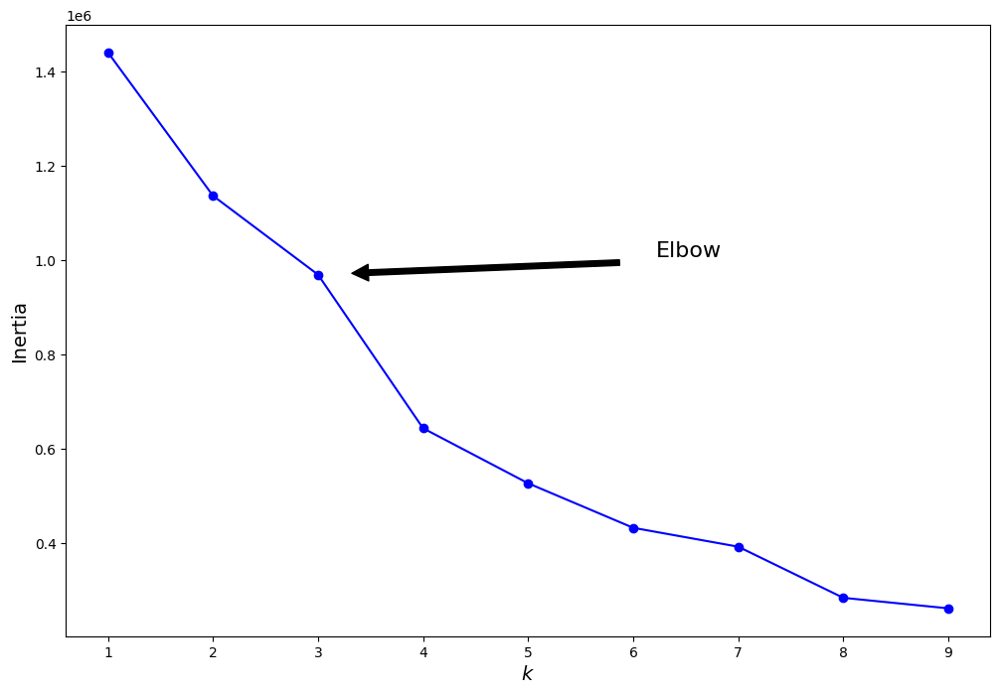

In [110]:
plt.figure(figsize=(12, 8))
plt.plot(range(1, 10), inertias, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.annotate('Elbow',
             xy=(3, inertias[2]),
             xytext=(0.55, 0.55),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
plt.show()

In [111]:
y = final_new_df.drop(['email_hash','job_position_imputation','company_hash_imputation'],axis=1)

In [112]:
# import hierarchical clustering libraries
import pandas as pd
import scipy.cluster.hierarchy as sch

scaled_df = pd.DataFrame(X, columns=y.columns, index=y.index)
scaled_df

,ctc,ctc_updated_year,orgyear_imputation,Year_of_experience,Designation,Class,Tier
0,-0.099288,0.280559,0.017571,-0.017571,-0.488527,0.751272,-0.519504
1,-0.154369,-0.474101,0.049039,-0.049039,-0.488527,-0.529403,-0.519504
2,-0.023022,0.280559,0.001837,-0.001837,-0.488527,-0.529403,-0.519504
3,-0.133184,-0.474101,0.033305,-0.033305,-0.488527,-0.529403,-0.519504
4,-0.073866,-0.474101,0.033305,-0.033305,-0.488527,2.031947,2.056931
...,...,...,...,...,...,...,...
205838,-0.173859,-0.474101,-0.108299,0.108299,-0.488527,-0.529403,-0.519504
205839,-0.150132,0.280559,0.033305,-0.033305,-0.488527,-0.529403,-0.519504
205840,-0.133184,1.035219,0.096240,-0.096240,0.872782,-0.529403,-0.519504
205841,0.239670,-0.474101,0.064772,-0.064772,-0.488527,-0.529403,-0.519504


In [ ]:
Z = sch.linkage(scaled_df, method='ward')

fig, ax = plt.subplots(figsize=(20, 12))
sch.dendrogram(Z, labels=scaled_df.index, ax=ax, color_threshold=2)
plt.xticks(rotation=90)
ax.set_ylabel('distance')

Actionable Insights :
1. salary updated on scaler is on 2019
2. In 2019 large employees salary got update
3. Salary increment started from 2015 till 2021 because the data contain ctc update year from 2015 till 2021
3. nvnv wgzohrnvzwj otqcxwto company code having large number of employees
4. Backend and fullsack engineer are more joining
5. year of experience and joining date are negative correlated
6. Cluster size 3 is best

Recommendations : Need to improve the more intake of data science field related